# California Housling Prices Data

### Introduction

This is the dataset is a modified version of the California Housing Data used in the paper Pace, R. Kelley, and Ronald Barry. "Sparse spatial autoregressions." Statistics & Probability Letters 33.3 (1997): 291-297.. It serves as an excellent introduction to implementing machine learning algorithms because it requires rudimentary data cleaning, has an easily understandable list of variables and sits at an optimal size between being too toyish and too cumbersome.

The data contains information from the 1990 California census. So although it may not help you with predicting current housing prices like the Zillow Zestimate dataset, it does provide an accessible introductory dataset for teaching people about the basics of machine learning.


The data pertains to the houses found in a given California district and some summary stats about them based on the 1990 census data. The columns are as follows, their names are pretty self-explanatory:

1. Median House Value: Median house value for households within a block (measured in US Dollars)
2. Median Income: Median income for households within a block of houses (measured in tens of thousands of US Dollars)(10k$)
3. Median Age: Median age of a house within a block; a lower number is a newer building [years]
4. Total Rooms: Total number of rooms within a block
5. Total Bedrooms: Total number of bedrooms within a block
6. Population: Total number of people residing within a block
7. Households: Total number of households, a group of people residing within a home unit, for a block
8. Latitude: A measure of how far north a house is; a higher value is farther north [°]
9. Longitude: A measure of how far west a house is; a higher value is farther west [°]
10. Distance to coast: Distance to the nearest coast point [m]
11. Distance to Los Angeles: Distance to the centre of Los Angeles [m]
12. Distance to San Diego: Distance to the centre of San Diego [m]
13. Distance to San Jose: Distance to the centre of San Jose [m]
14. Distance to San Francisco: Distance to the centre of San Francisco [m]


The original data (without the distance features) was initially featured in the following paper:
Pace, R. Kelley, and Ronald Barry. "Sparse spatial autoregressions." Statistics & Probability Letters 33.3 (1997): 291-297.

The original dataset can be found under the following link: https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

### Objective of this project

After Exploratory Data Analysis, Data wrangling, Data Visualization, Feature Engineering and Machine Learning and Deep Learning modles to:
1. Predict the California House Price by given variable values;
2. Find the most important feature for California House Price;
3. Comparing performance of different regression models.

### Import Libraries

In [192]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.style as style
style.use('ggplot')
import matplotlib.gridspec as gridspec
import seaborn as sns
sns.set_style("whitegrid")
from scipy.stats import norm
from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor, AdaBoostRegressor
from sklearn import ensemble
import warnings
warnings.filterwarnings("ignore")

### Load Dataset

In [197]:
df = pd.read_csv('California_Houses.csv')
df_original = df.copy()

In [198]:
df.head()

,Median_House_Value,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
0,452600.0,8.3252,41,880,129,322,126,37.88,-122.23,9263.040773,556529.158342,735501.806984,67432.517001,21250.213767
1,358500.0,8.3014,21,7099,1106,2401,1138,37.86,-122.22,10225.733072,554279.850069,733236.884360,65049.908574,20880.600400
2,352100.0,7.2574,52,1467,190,496,177,37.85,-122.24,8259.085109,554610.717069,733525.682937,64867.289833,18811.487450
3,341300.0,5.6431,52,1274,235,558,219,37.85,-122.25,7768.086571,555194.266086,734095.290744,65287.138412,18031.047568
4,342200.0,3.8462,52,1627,280,565,259,37.85,-122.25,7768.086571,555194.266086,734095.290744,65287.138412,18031.047568


### Exploratory Data Analysis

In [199]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Median_House_Value        20640 non-null  float64
 1   Median_Income             20640 non-null  float64
 2   Median_Age                20640 non-null  int64  
 3   Tot_Rooms                 20640 non-null  int64  
 4   Tot_Bedrooms              20640 non-null  int64  
 5   Population                20640 non-null  int64  
 6   Households                20640 non-null  int64  
 7   Latitude                  20640 non-null  float64
 8   Longitude                 20640 non-null  float64
 9   Distance_to_coast         20640 non-null  float64
 10  Distance_to_LA            20640 non-null  float64
 11  Distance_to_SanDiego      20640 non-null  float64
 12  Distance_to_SanJose       20640 non-null  float64
 13  Distance_to_SanFrancisco  20640 non-null  float64
dtypes: flo

In [200]:
df.describe()

,Median_House_Value,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,2.064000e+04,2.064000e+04,20640.000000,20640.000000
mean,206855.816909,3.870671,28.639486,2635.763081,537.898014,1425.476744,499.539680,35.631861,-119.569704,40509.264883,2.694220e+05,3.981649e+05,349187.551219,386688.422291
std,115395.615874,1.899822,12.585558,2181.615252,421.247906,1132.462122,382.329753,2.135952,2.003532,49140.039160,2.477324e+05,2.894006e+05,217149.875026,250122.192316
min,14999.000000,0.499900,1.000000,2.000000,1.000000,3.000000,1.000000,32.540000,-124.350000,120.676447,4.205891e+02,4.849180e+02,569.448118,456.141313
25%,119600.000000,2.563400,18.000000,1447.750000,295.000000,787.000000,280.000000,33.930000,-121.800000,9079.756762,3.211125e+04,1.594264e+05,113119.928682,117395.477505
50%,179700.000000,3.534800,29.000000,2127.000000,435.000000,1166.000000,409.000000,34.260000,-118.490000,20522.019101,1.736675e+05,2.147398e+05,459758.877000,526546.661701
75%,264725.000000,4.743250,37.000000,3148.000000,647.000000,1725.000000,605.000000,37.710000,-118.010000,49830.414479,5.271562e+05,7.057954e+05,516946.490963,584552.007907
max,500001.000000,15.000100,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,41.950000,-114.310000,333804.686371,1.018260e+06,1.196919e+06,836762.678210,903627.663298


#### Evaluating for Missing Data

In [201]:
missing_data=df.isnull()
missing_data.head(5)

,Median_House_Value,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [202]:
for column in missing_data.columns.values.tolist():
    print(column)
    print(missing_data[column].value_counts())
    print("")

Median_House_Value
False    20640
Name: Median_House_Value, dtype: int64

Median_Income
False    20640
Name: Median_Income, dtype: int64

Median_Age
False    20640
Name: Median_Age, dtype: int64

Tot_Rooms
False    20640
Name: Tot_Rooms, dtype: int64

Tot_Bedrooms
False    20640
Name: Tot_Bedrooms, dtype: int64

Population
False    20640
Name: Population, dtype: int64

Households
False    20640
Name: Households, dtype: int64

Latitude
False    20640
Name: Latitude, dtype: int64

Longitude
False    20640
Name: Longitude, dtype: int64

Distance_to_coast
False    20640
Name: Distance_to_coast, dtype: int64

Distance_to_LA
False    20640
Name: Distance_to_LA, dtype: int64

Distance_to_SanDiego
False    20640
Name: Distance_to_SanDiego, dtype: int64

Distance_to_SanJose
False    20640
Name: Distance_to_SanJose, dtype: int64

Distance_to_SanFrancisco
False    20640
Name: Distance_to_SanFrancisco, dtype: int64



Based on summary above, no missing data were found!

#### Visualization - House Location and Distribution

In [203]:
# !pip3 install folium
# !pip3 install wget

In [204]:
import folium
import wget
import pandas as pd
# Import folium MarkerCluster plugin
from folium.plugins import MarkerCluster
# Import folium MousePosition plugin
from folium.plugins import MousePosition
# Import folium DivIcon plugin
from folium.features import DivIcon

In [257]:
# Initial the map
LosAngeles_coordinate = [34.052235, -118.243683]
site_map = folium.Map(location=LosAngeles_coordinate, zoom_start=5)

marker_cluster = MarkerCluster()
# Add the Marker cluster to the site map
#incidents = site_map.add_child(marker_cluster)
incidents = MarkerCluster().add_to(site_map)

for lat, lng, in zip(df.Latitude, df.Longitude):
    folium.Marker(
        location=[lat, lng],
        icon=folium.Icon(color='red')
    ).add_to(incidents)

# display map
site_map

#### Check Distribution of Continous Variables

In [258]:
cont_col = ['Median_Income', 'Median_Age', 'Tot_Rooms', 'Tot_Bedrooms', 'Population', 'Households', 'Distance_to_coast', 
            'Distance_to_LA', 'Distance_to_SanDiego', 'Distance_to_SanJose', 'Distance_to_SanFrancisco']
loc_col = ['Latitude', 'Longitude']
dist_col = ['Distance_to_coast', 'Distance_to_LA', 'Distance_to_SanDiego', 'Distance_to_SanJose', 'Distance_to_SanFrancisco']
target = 'Median_House_Value'
df["Median_House_Value"] = np.log(df["Median_House_Value"]) #apply np.log() to target

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


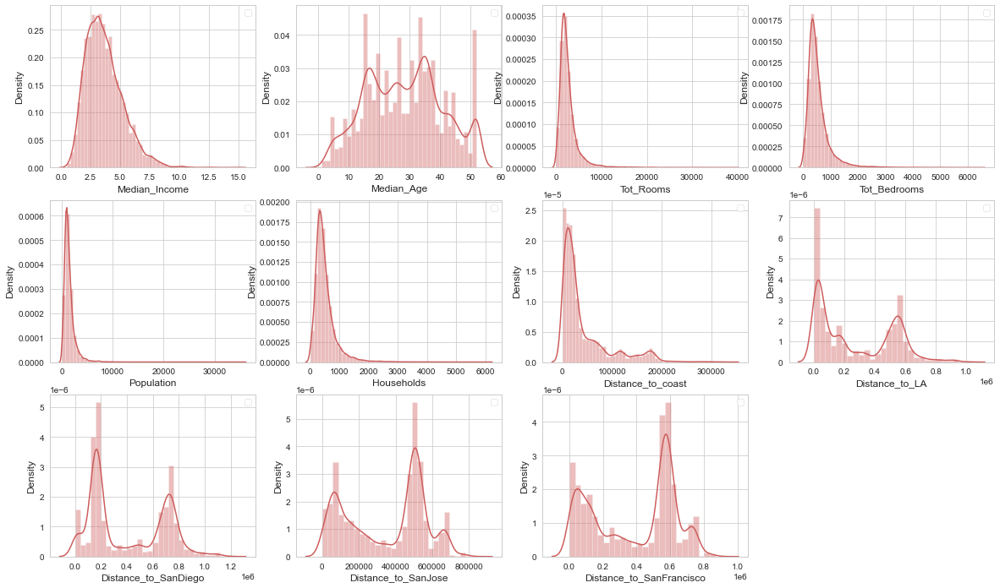

In [240]:
plt.figure(figsize=(20, 12))
for i, column in enumerate(cont_col, 1):
    plt.subplot(3, 4, i)
    sns.distplot(x=df[column],color='indianred')
    plt.legend()
    plt.xlabel(column)

#### Correlation Matrix

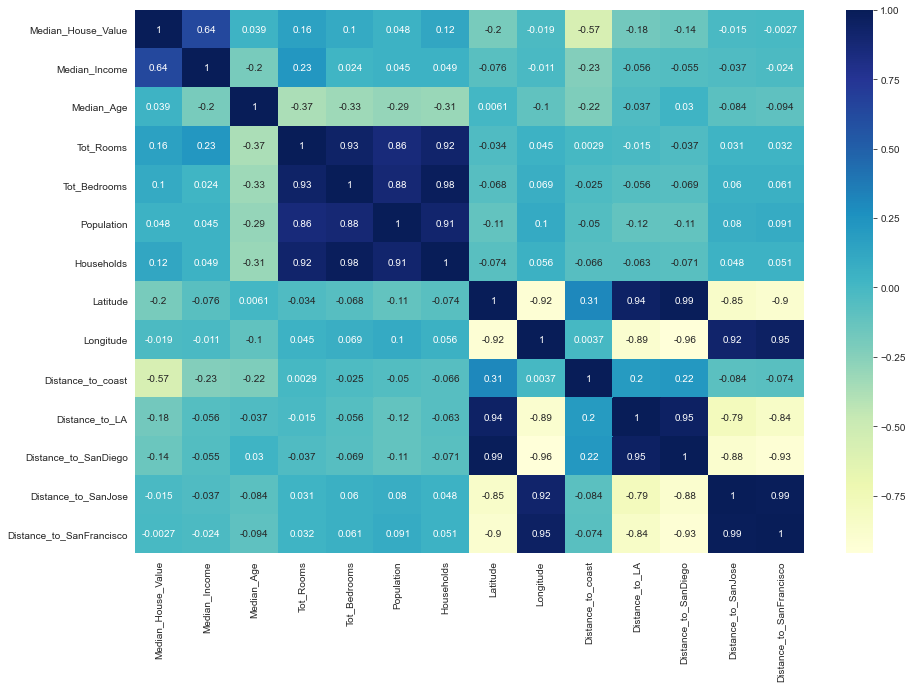

In [241]:
corrMatrix = df.corr()
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(15, 10))
    ax = sns.heatmap(corrMatrix, annot=True, cmap="YlGnBu")

#### Relationship between target and different variables

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


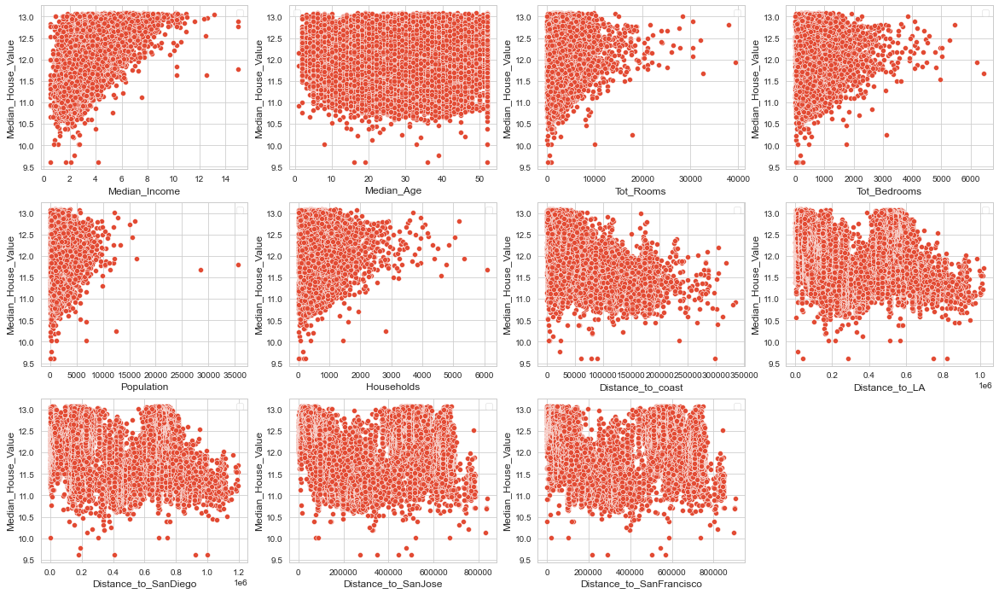

In [242]:
plt.figure(figsize=(20, 12))
for i, column in enumerate(cont_col, 1):
    plt.subplot(3, 4, i)
    sns.scatterplot(data=df, x=df[column], y=df['Median_House_Value'])
    plt.legend()
    plt.xlabel(column)

#### Distribution of target - Median_House_Value

<AxesSubplot:xlabel='Median_House_Value'>

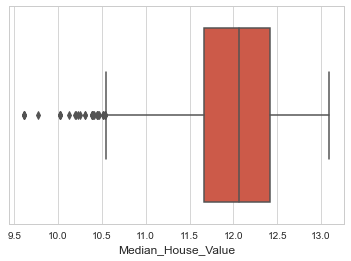

In [244]:
sns.boxplot(x=df["Median_House_Value"])

<AxesSubplot:xlabel='Median_House_Value', ylabel='Count'>

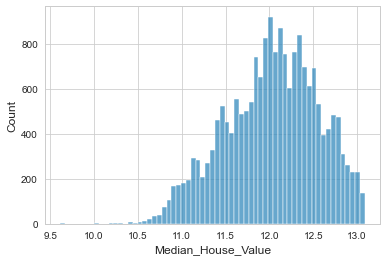

In [245]:
sns.histplot(x=df["Median_House_Value"])

#### Remove outliers of the target

In [246]:
def remove_outlier(df, col_name):
    q1 = df[col_name].quantile(0.25)
    q3 = df[col_name].quantile(0.75)
    iqr = q3-q1 #Interquartile range
    outlier = []
    for i in df[col_name]:
        if i<(q1 - 1.5 * iqr) or i>(q3 + 1.5 * iqr):
            outlier.append(i)
    outlier = pd.DataFrame(outlier,columns=['outlier'])
    print('There is {}% Outlier removed in {} according to IQR rule'.format(round((outlier.shape[0]/df.shape[0])*100,2),col_name))
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    df = df[(df[col_name] > fence_low) & (df[col_name] < fence_high)]
    return df

In [247]:
df = remove_outlier(df,target)

There is 0.16% Outlier removed in Median_House_Value according to IQR rule


<AxesSubplot:xlabel='Median_House_Value', ylabel='Count'>

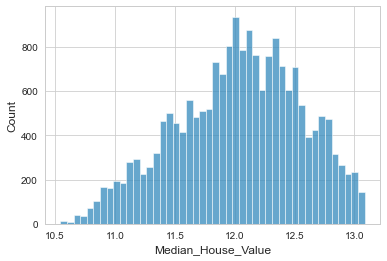

In [248]:
sns.histplot(x=df["Median_House_Value"])

### Machine Learning & Deep Learning

#### load dataset, normalization, split training and testing sets

In [249]:
x = df.drop(['Median_House_Value','Longitude','Latitude'],axis=1)
scaler = StandardScaler()
scaler.fit(x)
x_scaled = scaler.transform(x)
y = df['Median_House_Value']

x_train, x_test, y_train, y_test = train_test_split(x_scaled,y,test_size=0.2,random_state=0)
print(f'Train input: {x_train.shape}')
print(f'Train target: {y_train.shape}')
print(f'Test input: {x_test.shape}')
print(f'Test target: {y_test.shape}')

Train input: (15629, 11)
Train target: (15629,)
Test input: (3908, 11)
Test target: (3908,)


In [259]:
# !pip install lightgbm
# from lightgbm import LGBMRegressor

In [260]:
# !pip install xgboost
# from xgboost.sklearn import XGBRegressor

In [261]:
# !pip install plotnine
# from plotnine import *

#### Fitting models and Check Performance for different models

In [251]:
r2 = []
model = []
RMSE = []
regressor = [LinearRegression(),RandomForestRegressor(),KNeighborsRegressor(),ensemble.GradientBoostingRegressor(),LGBMRegressor(),XGBRegressor()]
for obj in regressor:
    model_name = type(obj).__name__
    obj.fit(x_train,y_train)
    predict=obj.predict(x_test)
    r2.append(r2_score(y_test,predict))
    model.append(model_name)
    RMSE.append(mean_squared_error(y_test, predict, squared=False))
models = pd.DataFrame({'Model':model, 'r2':r2, 'RMSE':RMSE})
print(models)

                       Model        r2      RMSE
0           LinearRegression  0.656473  0.305381
1      RandomForestRegressor  0.828484  0.215781
2        KNeighborsRegressor  0.744466  0.263382
3  GradientBoostingRegressor  0.776302  0.246429
4              LGBMRegressor  0.828027  0.216069
5               XGBRegressor  0.831684  0.213759


Text(0.5, 1.0, 'RMSE for models')

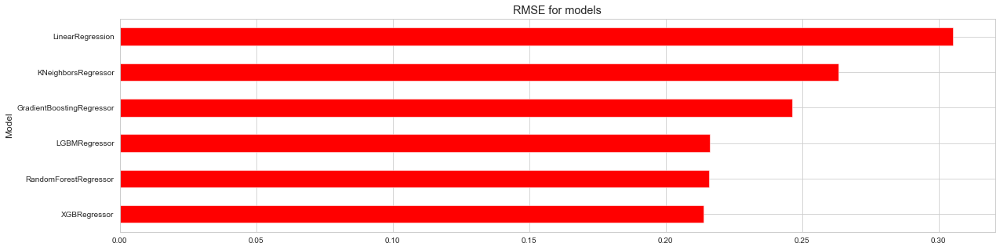

In [252]:
models = models.set_index('Model')
plt.figure(figsize=(20,5))
models['RMSE'].sort_values().plot(kind='barh', color='r', align='center')
plt.title('RMSE for models')

#### Feature importance

In [253]:
reg = XGBRegressor()
reg.fit(x_train,y_train)
model_name = type(reg).__name__

for name, importance in zip(x, reg.feature_importances_):
    print(name, "=", round(importance,3))

Median_Income = 0.214
Median_Age = 0.021
Tot_Rooms = 0.03
Tot_Bedrooms = 0.032
Population = 0.041
Households = 0.032
Distance_to_coast = 0.37
Distance_to_LA = 0.055
Distance_to_SanDiego = 0.069
Distance_to_SanJose = 0.06
Distance_to_SanFrancisco = 0.074


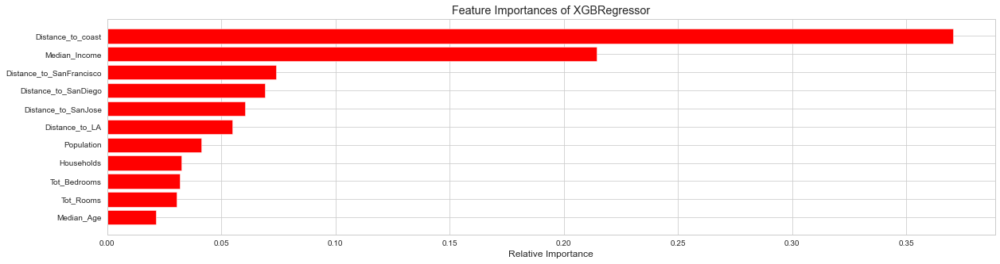

In [254]:
features = x
importances = reg.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(20,5))
plt.title('Feature Importances of {}'.format(model_name))
plt.barh(range(len(indices)), importances[indices], color='r', align='center')
plt.yticks(range(len(indices)),features.columns[indices])
plt.xlabel('Relative Importance')
plt.show()

### Median house value prediction

Accuracy score for XGBRegressor is 0.80, RMSE is 42132.57


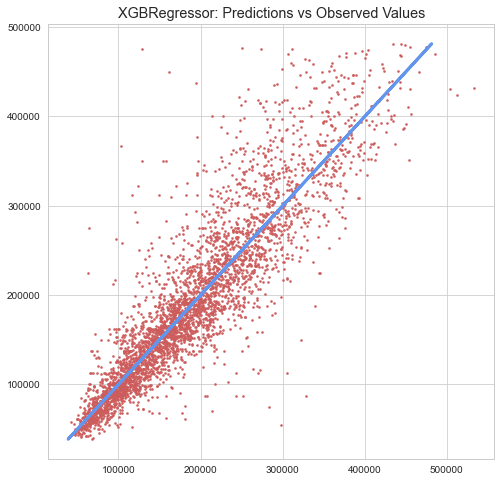

In [255]:
y_test = np.exp(y_test)
y_pred = np.exp(reg.predict(x_test))

model_name = type(reg).__name__
plt.subplots(figsize=(8,8))
plt.scatter(y_pred,y_test,s=4, color='indianred')
plt.plot(y_test, y_test,color='cornflowerblue', linewidth=3)
plt.title('{}: Predictions vs Observed Values'.format(model_name))
print("Accuracy score for {} is {:.2f}, RMSE is {:.2f}".format(model_name,r2_score(y_test, y_pred),mean_squared_error(y_test, y_pred, squared=False)))

### Conclusion

Based on above analysis, California House Price is most related with the location, that is, whether the house is close to west cost, followed by the househould income. 
